# **VISUALIZATION & SPECTRA**

This notebook with help you make beautiful plots of your datacube, both in the pixel **(visualization)** and wavelength **(spectral)** dimensions. 

    
Notebook Table of Contents:
<br>&emsp; 1A. RGB Images
<br>&emsp; 1B. Process Images
<br>&emsp; 1C. GIFs and Subplots
<br>&emsp; 2A. Spectra Plots



# **PART 1: Visualization**

Keep in mind that the steps of the datacube include (with their step # referenced in the notebook): 
<br>&emsp; 1) SDSS image
<br>&emsp; 2) Resampling/Cutting 
<br>&emsp; 2.5) Segmentation Maps [Cleaning Non-Central Sources]
<br>&emsp; 3) Cleaning
<br>&emsp; 3.5) Filter Observation Map [Deciding Galaxy Pixels]
<br>&emsp; 4) SDSS + Roman Datacube 

In [2]:
import os
import subprocess
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from matplotlib import gridspec
from astropy.io import fits
from astropy.visualization import make_lupton_rgb

# <span style='color:Red'> 1A. RGB Images: </span>  1) SDSS, 2) Resampled, 3) Cleaned

In [25]:
default = '/pscratch/sd/j/joygong/Data-Cube-'                     # modify this!

In [81]:
# generate file name
def file_name(p, stage): 
    # default = '/pscratch/sd/j/joygong/Data-Cube-'                 
    cmd = 'ls {}/{}/debug/{} -AU | head -2'.format(default, p, stage)
    file = subprocess.run(cmd, shell=True, stdout=subprocess.PIPE).stdout
    file = file.rstrip().decode("utf-8")
    
    sub = '\n'
    result = sub in file
    
    if result == True: 
        cutoff = 24
        file1 = file[:cutoff]
        file2 = file[cutoff:]
        path1 = default + '/' + p + '/debug/' + stage + '/' + file1
        path2 = default + '/' + p + '/debug/' + stage + '/' + file2.strip()
        return path1, path2

    else: 
        path = default + '/' + p + '/debug/' + stage + '/' + file     # absolute path. note p = just the local directory name
        return path
    
# make rgb image
def rgb(p, stage): 
    # default = 
    if stage == 'sdss_og': 
        # original sdss images: ugriz
        g = fits.open('{}'.format(file_name(p, 'sdss_og')))[0].data[1]
        r = fits.open('{}'.format(file_name(p, 'sdss_og')))[0].data[2]
        i = fits.open('{}'.format(file_name(p, 'sdss_og')))[0].data[3]
    
    if stage == 'resampled':
        # resampled: rguiz 
        g = np.load('{}'.format(file_name(p, 'resampled')))['cutout_g']
        r = np.load('{}'.format(file_name(p, 'resampled')))['cutout_r']
        i = np.load('{}'.format(file_name(p, 'resampled')))['cutout_i']
   
    if stage == 'cleaned': 
        # cleaned: ugriz 
        g = fits.open('{}'.format(file_name(p, 'cleaned')))[0].data[1]
        r = fits.open('{}'.format(file_name(p, 'cleaned')))[0].data[2]
        i = fits.open('{}'.format(file_name(p, 'cleaned')))[0].data[3]
    
    # rgb_default = make_lupton_rgb(i, r, g, filename="test.jpeg")  # save to jpeg
    rgb_default = make_lupton_rgb(i, r, g)
    #plt.imshow(rgb_default, origin='lower')

    # rgb_stretched = make_lupton_rgb(i, r, g, Q=10, stretch=0.5, filename="test2.jpeg")
    rgb_stretched = make_lupton_rgb(i, r, g, Q=10, stretch=0.5)
    #plt.imshow(rgb, origin='lower')
    return rgb_default, rgb_stretched

stages = ['sdss_og', 'resampled', 'segm', 'cleaned', 'filter_obs_map']


In [82]:
# plot images for ALL PATHS
def plot_rgb_stage(stage): 
    for i, p in enumerate(paths): 
        plt.figure(i)
        plt.imshow(rgb(p, '{}'.format(stage))[1], origin='lower')
        plt.title('{}_{}'.format(p, '{}'.format(stage)))
        
# plot MAIN STAGES (sdss, resamped, cleaned) for one path 
def plot_rgb_all_stages(p): 
    
    fig = plt.figure(figsize=(17.5, 5)) 
    gs = gridspec.GridSpec(1, 3, width_ratios=[1.5, 1, 1]) 
    ax0 = plt.subplot(gs[0])
    ax0.imshow(rgb(p, '{}'.format(stages[0]))[1], origin='lower')
    ax0.set_title('{}_{}'.format(p, '{}'.format(stages[0])))
    ax1 = plt.subplot(gs[1])
    ax1.imshow(rgb(p, '{}'.format(stages[1]))[1], origin='lower')
    ax1.set_title('{}_{}'.format(p, '{}'.format(stages[1])))
    ax2 = plt.subplot(gs[2])
    ax2.imshow(rgb(p, '{}'.format(stages[3]))[1], origin='lower')
    ax2.set_title('{}_{}'.format(p, '{}'.format(stages[3])))
    
    plt.tight_layout()

In whatever variation of `{path}/datacube_paths.txt` that stores your datacube paths, extract the directory name p of the datacube. One such way to do this is:

In [79]:
paths = np.loadtxt('datacube_paths_011324_temp.txt', dtype='str')
for i in range(len(paths)): 
    paths[i] = paths[i][34:54]
paths

array(['3DcYQ0lb4KJyfzKzlUXI', 'LmJHI21YeTd4AwmYnEDm',
       '1fNHsdZlI87Brq4iYKAt', 'QQsrSrH8nA5pMBBkNgS1',
       'EbTKT5YQ2l4B7A2BgBqz', '33kuZBaMo0NbbMjaQ1cx',
       'XI4iMWh30qgbYQHXt0d1', '5iqcq8AiZ2Isdszu7qUc',
       '8grs4xaeF0pnw6tOgw16', 'bVQBSHo93R7m9GQLSVvU',
       'D1ORoZzQuMzEo3NCcWRZ', 'eQJHr49ZQ5QeCCYLbhv6'], dtype='<U80')

## To plot all stages for one datacube, use `plot_rgb_all_stages`:

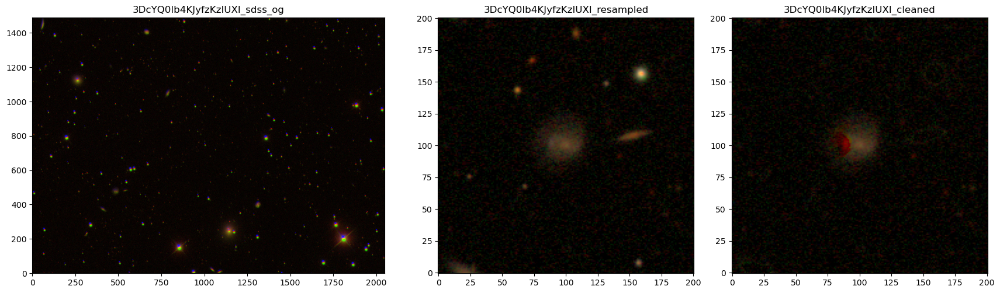

In [83]:
plot_rgb_all_stages('3DcYQ0lb4KJyfzKzlUXI')

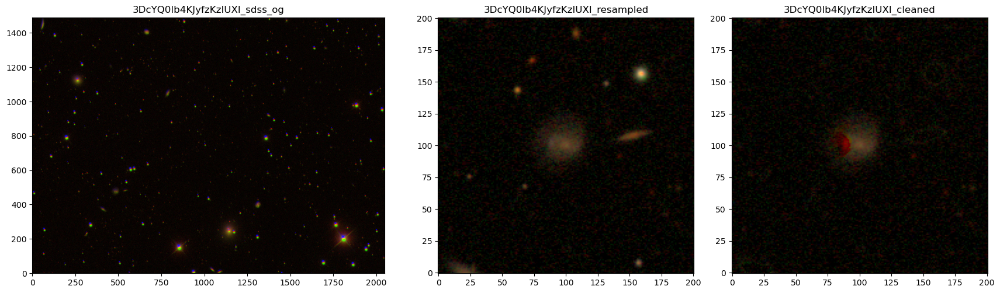

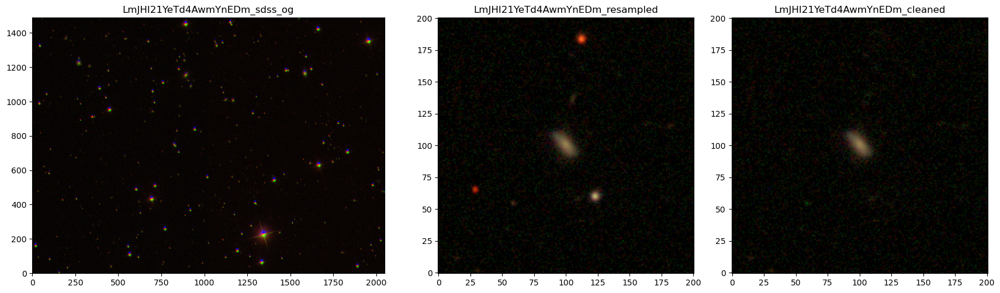

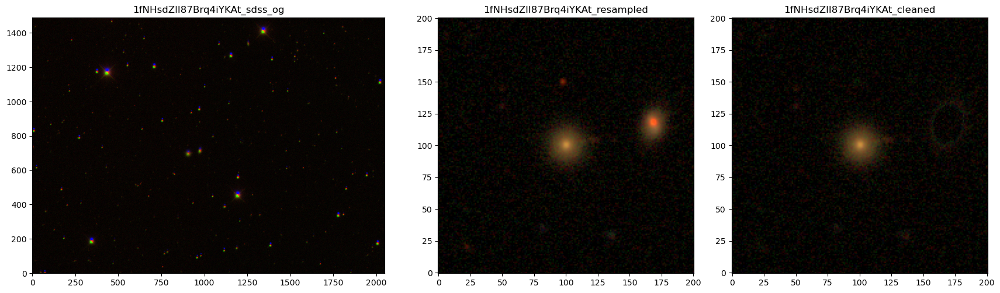

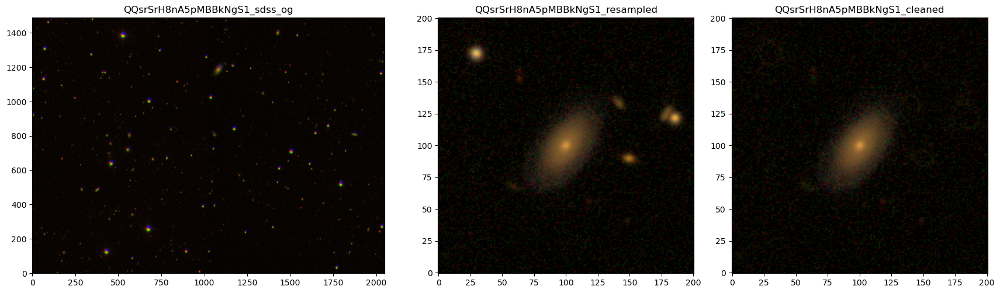

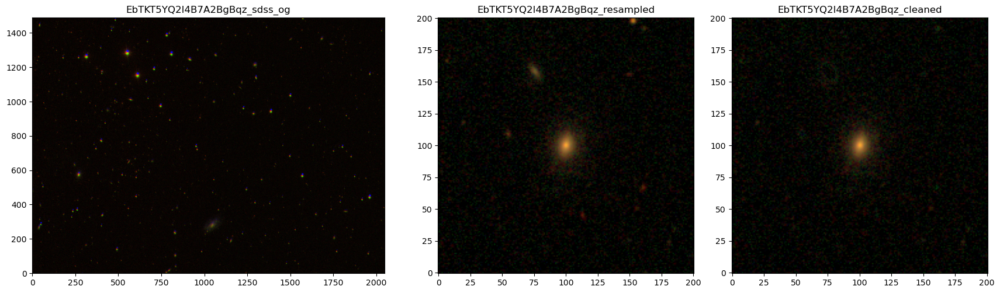

...

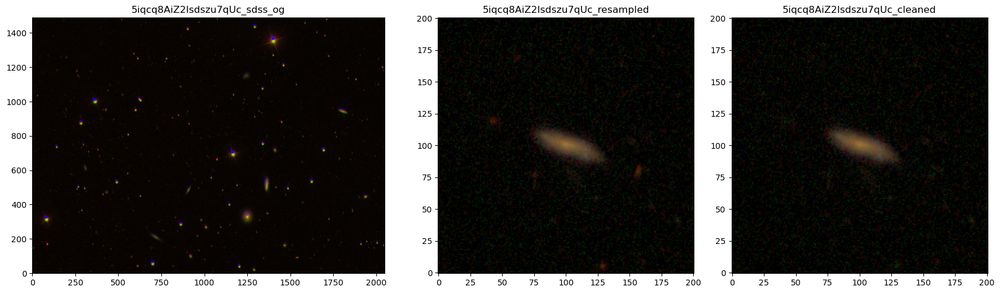

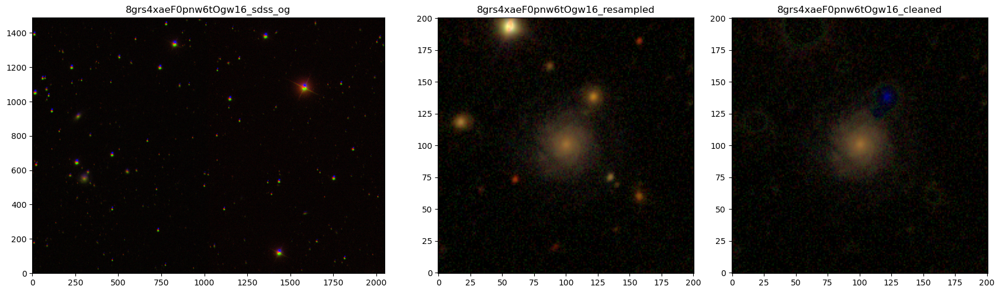

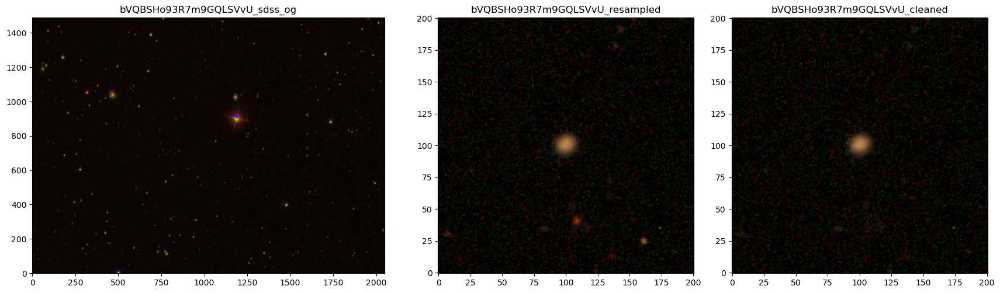

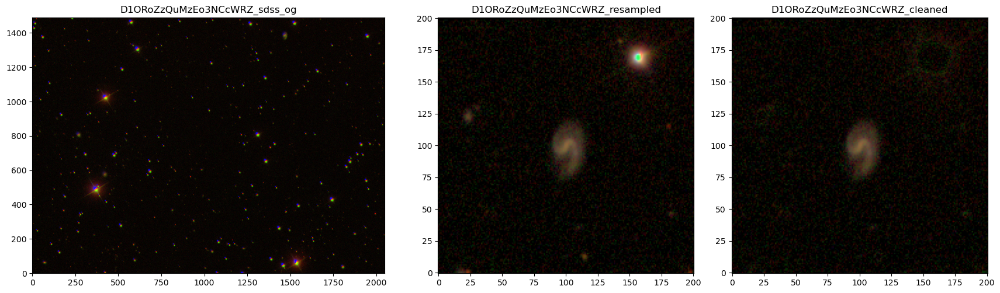

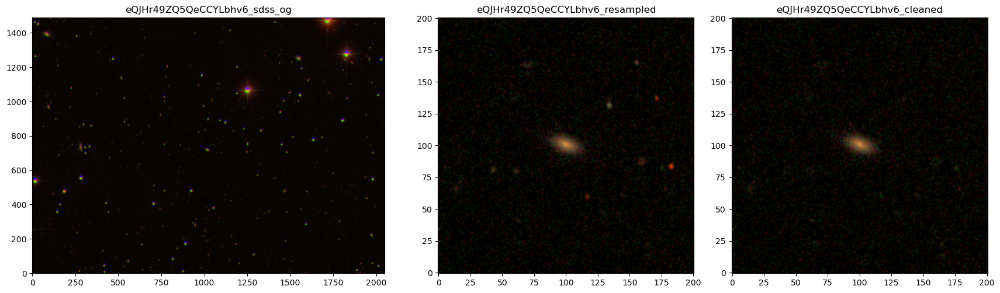

In [84]:
for p in paths: 
    plot_rgb_all_stages(p)

## To group images across datacubes by stage, use `plot_rgb_stage`.
Note: This results in a lot of scrolling so best if avoided! 

# <span style='color:Red'> 1B. Process Images:  </span>  2.5) Segmentation Maps, 3.5) Filter Observation Maps, 4) SDSS & Roman Datacubes

## 2.5) Segmentation Maps [Between Resampling and Cleaning]

In [11]:
default = '/pscratch/sd/j/joygong/Data-Cube-'                 # modify this!

In [14]:
def file_name(p, stage): 
    # default = '/pscratch/sd/j/joygong/Data-Cube-'                 
    cmd = 'ls {}/{}/debug/{} -AU | head -2'.format(default, p, stage)
    file = subprocess.run(cmd, shell=True, stdout=subprocess.PIPE).stdout
    file = file.rstrip().decode("utf-8")
    
    sub = '\n'
    result = sub in file
    
    if result == True: 
        cutoff = 24
        file1 = file[:cutoff]
        file2 = file[cutoff:]
        path1 = default + '/' + p + '/debug/' + stage + '/' + file1
        path2 = default + '/' + p + '/debug/' + stage + '/' + file2.strip()
        return path1, path2

    else: 
        path = default + '/' + p + '/debug/' + stage + '/' + file     # absolute path. note p = just the local directory name
        return path

In [27]:
def plot_segm(p): 

    og = np.load('{}'.format(file_name(p, 'segm')[0]))['segms_og']      # original uncleaned maps
    cl = np.load('{}'.format(file_name(p, 'segm')[1]))['segms_cl']      # cleaned maps
    
    fig = plt.figure(figsize=(20, 8)) 
    gs = gridspec.GridSpec(2, 5, width_ratios=[1, 1, 1, 1, 1]) 
    filters = ['u', 'g', 'r', 'i', 'z']
    
    for i in range(2): 
        for j in range(5): 
            ax = plt.subplot(gs[i, j])
            if i == 0: 
                ax.imshow(og[j], origin='lower')
                ax.set_title('{}_{}_{}'.format(p, 'segm_og', filters[j]), fontsize=8)
            if i == 1: 
                ax.imshow(cl[j], origin='lower')
                ax.set_title('{}_{}_{}'.format(p, 'segm_cl', filters[j]), fontsize=8)
            
    plt.tight_layout()

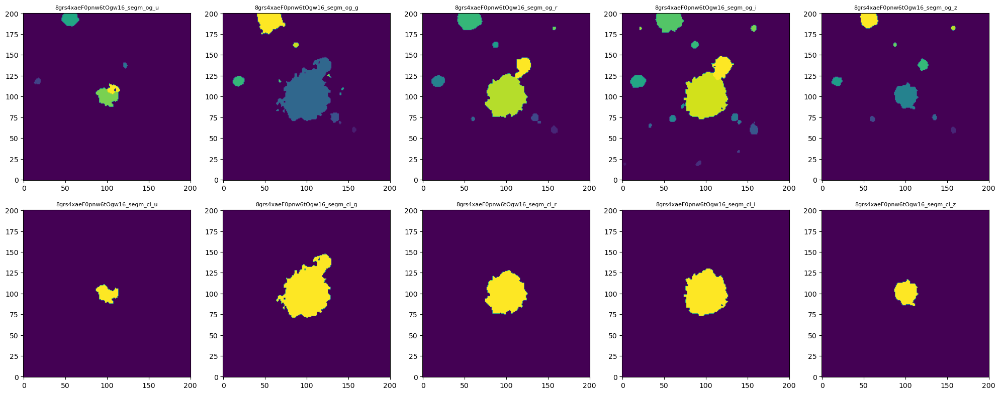

In [283]:
plot_segm('8grs4xaeF0pnw6tOgw16')

## 3.5) Filter Observation Maps [Classifying Galaxy Pixels]

In [57]:
def plot_filter_obs_map(p): 
    f = np.load('{}'.format(file_name(p, 'filter_obs_map')))
    
    fig = plt.figure(figsize=(10, 10))
    ax = plt.subplot(111)
    ax.imshow(f['filter_obs_map'], cmap='tab20b', origin='lower', aspect='equal')
    
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    cbar = plt.colorbar(im, cax=cax)
    cbar.set_label('Number of filter observations')

    xLabel, yLabel = r'$X$ [pix]', r'$Y$ [pix]'
    ax.set_xlabel(xLabel)
    ax.set_ylabel(yLabel)
    ax.set_title('{}_{}'.format(p, 'filter_obs_map'))
    

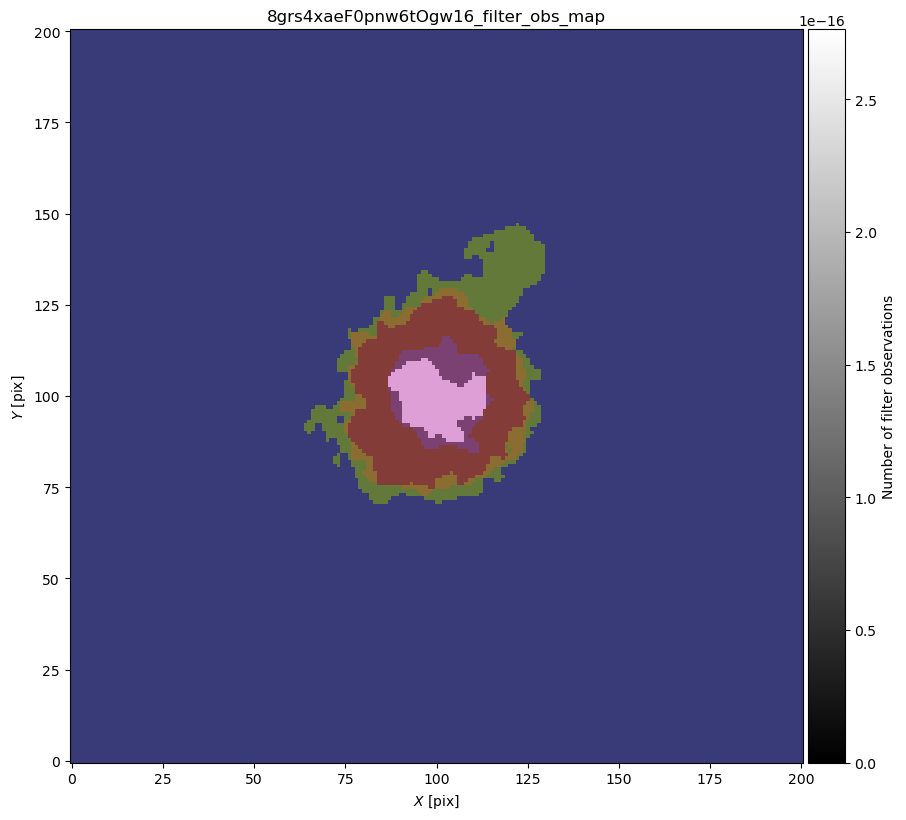

In [284]:
plot_filter_obs_map('8grs4xaeF0pnw6tOgw16')

## 4. SDSS & Roman Datacubes

Let's get the absolute paths and directory names of the Roman datacubes: 

In [123]:
datacube_paths = np.loadtxt('datacube_paths_011324_temp.txt', dtype='str')
dir_paths = np.copy(datacube_paths)

for i in range(len(dir_paths)): 
    dir_paths[i] = dir_paths[i][34:54]
    
datacube_paths, dir_paths

(array(['/pscratch/sd/j/joygong/Data-Cube-/3DcYQ0lb4KJyfzKzlUXI/roman_datacube_0.755.fits',
        '/pscratch/sd/j/joygong/Data-Cube-/LmJHI21YeTd4AwmYnEDm/roman_datacube_0.463.fits',
        '/pscratch/sd/j/joygong/Data-Cube-/1fNHsdZlI87Brq4iYKAt/roman_datacube_0.626.fits',
        '/pscratch/sd/j/joygong/Data-Cube-/QQsrSrH8nA5pMBBkNgS1/roman_datacube_0.84.fits',
        '/pscratch/sd/j/joygong/Data-Cube-/EbTKT5YQ2l4B7A2BgBqz/roman_datacube_1.057.fits',
        '/pscratch/sd/j/joygong/Data-Cube-/33kuZBaMo0NbbMjaQ1cx/roman_datacube_0.643.fits',
        '/pscratch/sd/j/joygong/Data-Cube-/XI4iMWh30qgbYQHXt0d1/roman_datacube_1.15.fits',
        '/pscratch/sd/j/joygong/Data-Cube-/5iqcq8AiZ2Isdszu7qUc/roman_datacube_0.709.fits',
        '/pscratch/sd/j/joygong/Data-Cube-/8grs4xaeF0pnw6tOgw16/roman_datacube_0.938.fits',
        '/pscratch/sd/j/joygong/Data-Cube-/bVQBSHo93R7m9GQLSVvU/roman_datacube_0.906.fits',
        '/pscratch/sd/j/joygong/Data-Cube-/D1ORoZzQuMzEo3NCcWRZ/roman_datacube_0.5

And now the absolute paths of the SDSS (Roman before modifications), smoothed Roman, and unsmoothed Roman datacubes:

In [68]:
def datacube_names(p):                                  # where p is DIRECTORY name
    
    cmd1 = 'ls {}/{} | grep datacube | head -1'.format(default, p)
    sdss = subprocess.run(cmd1, shell=True, stdout=subprocess.PIPE).stdout
    sdss = sdss.rstrip().decode("utf-8")
    
    cmd2 = 'ls {}/{} | grep datacube | head -2 | tail -1'.format(default, p)
    smoothed = subprocess.run(cmd2, shell=True, stdout=subprocess.PIPE).stdout
    smoothed = smoothed.rstrip().decode("utf-8")
    
    cmd3 = 'ls {}/{} | grep datacube | tail -1'.format(default, p)
    unsmoothed = subprocess.run(cmd3, shell=True, stdout=subprocess.PIPE).stdout
    unsmoothed = unsmoothed.rstrip().decode("utf-8")
    
    sdss = default + '/' + p + '/' + sdss
    smoothed = default + '/' + p + '/' + smoothed
    unsmoothed = default + '/' + p + '/' + unsmoothed
    
    return sdss, unsmoothed, smoothed

We plot one spectral (wavelength) frame of the datacubes: 

In [280]:
def plot_datacubes(p):                                      # where p is DIRECTORY name 

    # default = '/pscratch/sd/j/joygong/Data-Cube-'   
    fig = plt.figure(figsize=(15, 50)) 
    gs = gridspec.GridSpec(1, 3, width_ratios=[1, 1, 1]) 

    cubes = (fits.open(datacube_names(p)[0])[0].data*10*1000,               # flux density (erg/s/cm²/nm)
             fits.open(datacube_names(p)[1])[0].data*10*1000, 
             fits.open(datacube_names(p)[2])[0].data*10*1000)

    for i in range(3):
        ax = plt.subplot(gs[i])
        im = ax.imshow(cubes[i][1000, :, :], origin='lower', cmap='gray')
        ax.set_title('{}'.format(datacube_names(p)[i].replace(default, '')[1:]), fontsize=6)

        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.05)
        cbar = plt.colorbar(im, cax=cax)

        if i == 2: 
            cbar.set_label('Flux Density (erg/s/cm²/nm)')

    plt.show()

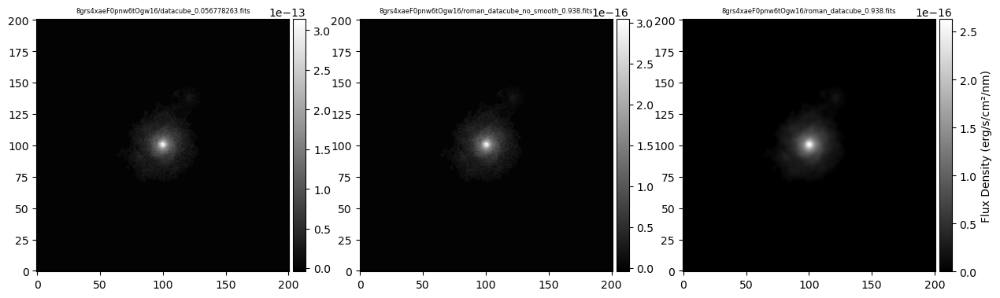

In [285]:
plot_datacubes('8grs4xaeF0pnw6tOgw16')

Note: If you just wanted to plot one datacube, use this function: 

In [149]:
def plot_datacube(p):                                       # where p is ABSOLUTE path 
    # default = '/pscratch/sd/j/joygong/Data-Cube-' 
    
    f = fits.open(p)[0].data*10*1000                        # flux density (erg/s/cm²/nm)
    plt.imshow(f[1000, :, :], origin='lower', cmap='gray')
    plt.colorbar(label='Flux Density (erg/s/cm²/nm)')
    
    abs_path = '/pscratch/sd/j/joygong/Data-Cube-/8grs4xaeF0pnw6tOgw16/roman_datacube_0.938.fits'
    plt.title('{}'.format(p.replace(default, '')[1:]), fontsize=8)

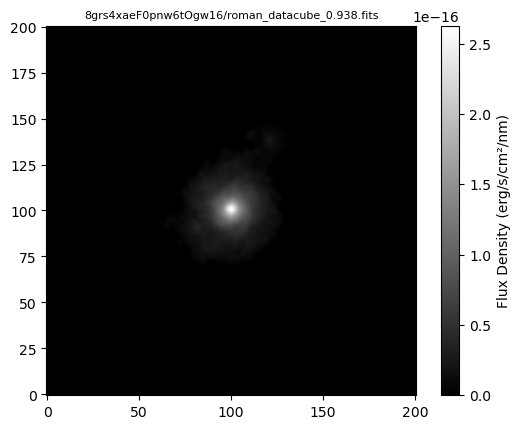

In [150]:
plot_datacube('/pscratch/sd/j/joygong/Data-Cube-/8grs4xaeF0pnw6tOgw16/roman_datacube_0.938.fits')

# <span style='color:Red'> 1C. Fun Stuff:  </span> GIFs and Subplots of Datacube

## GIFs

In [47]:
types = {'sdss':0, 'unsmoothed':1, 'smoothed':2}

def make_gif(p, type):                          # where p is DIRECTORY name 
    
    if type == 'sdss':
        f = fits.open('{}'.format(datacube_names(p)[0]))[0].data 
    if type == 'unsmoothed':
        f = fits.open('{}'.format(datacube_names(p)[1]))[0].data 
    if type == 'smoothed':
        f = fits.open('{}'.format(datacube_names(p)[2]))[0].data 

    f_blk = f[0::10]*1000*10       # 430 frames, in erg/s/cm^2/A

    pics = []
    for i in range(len(f_blk)): 
        pics.append(f_blk[i, :, :])

    pics = np.array(pics)

    fig, ax = plt.subplots()

    ims = []
    for i, pic in enumerate(pics):
        im = ax.imshow(pic, animated=True, origin='lower')
        ax.set_title('{}'.format(datacube_names(p)[types['{}'.format(type)]].replace(default, '')[1:]), fontsize=6)

        # divider = make_axes_locatable(ax)
        # cax = divider.append_axes("right", size="5%", pad=0.05)
        # cbar = plt.colorbar(im, cax=cax)
        # cbar.set_label('Flux Density (erg/s/cm²/nm)')
        
        ims.append([im])

    ani = animation.ArtistAnimation(fig, ims, interval=50, blit=True,
                                    repeat_delay=1000)

    ani.save('{}.gif'.format(datacube_names(p)[types['{}'.format(type)]].replace(default, '')[1:]), writer='pillow')
    # this will save to the directory of the datacube 
    

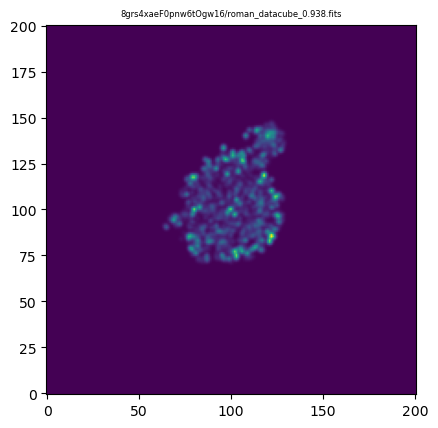

In [48]:
make_gif('8grs4xaeF0pnw6tOgw16', type='smoothed')

## Subplots

In [66]:
types = {'sdss':0, 'unsmoothed':1, 'smoothed':2}

def subplots(p, type):           # where p is DIRECTORY name 
    
    if type == 'sdss':
        f = fits.open('{}'.format(datacube_names(p)[0]))
    if type == 'unsmoothed':
        f = fits.open('{}'.format(datacube_names(p)[1]))
    if type == 'smoothed':
        f = fits.open('{}'.format(datacube_names(p)[2]))

    flux = f[0].data*1000*10
    wvs = f[1].data
    wvs = wvs.astype('float')*10

    fig = plt.figure(figsize=(20, 20)) 
    gs = gridspec.GridSpec(5, 5, width_ratios=[1, 1, 1, 1, 1]) 

    inds = np.arange(0, 25, 1).reshape(5, 5)*175

    for i in range(5): 
        for j in range(5): 
            ax = plt.subplot(gs[i, j])
            ax.imshow(flux[inds[i,j]], origin='lower', cmap='gray')
            ax.text(10, 10, '{:.3f} Å'.format(wvs[inds[i,j]]), color='white')

    fig.suptitle('{}'.format(datacube_names(p)[types['{}'.format(type)]].replace(default, '')[1:]), fontsize=15)
    fig.tight_layout()
    fig.subplots_adjust(top=0.95)

    plt.show()

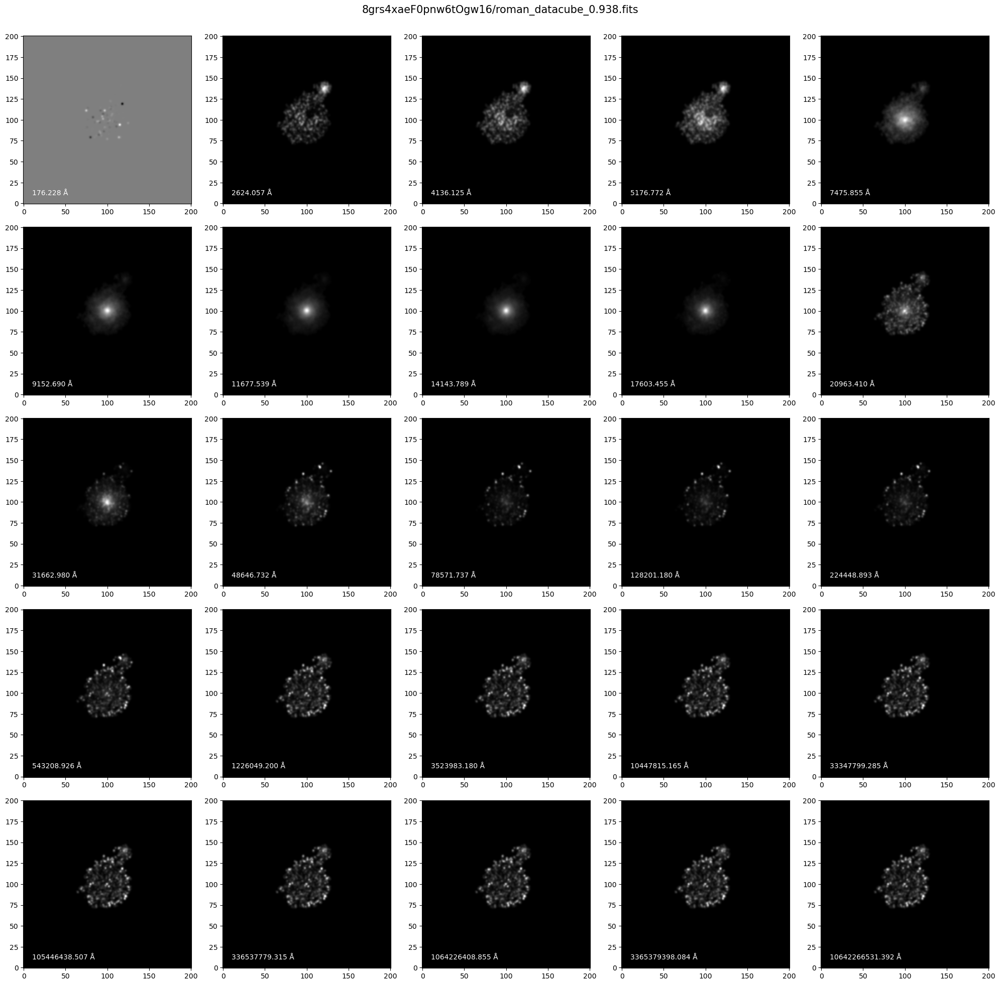

In [67]:
subplots('8grs4xaeF0pnw6tOgw16', type='smoothed')


<hr style="border:2px solid blue">


# **PART 2: Plotting Spectra (SEDs)**

This is mostly for confirmation that each pixel in the galaxy has a different SED. 
<br> It is also good as a sanity check to guess the type of galaxy based on bluer or redder emission, and compare to photometric fluxes (i.e., vertical slices of datacube). 

Note! Be careful: 
<br> * The SED flux density units are stored as $W/m^2/nm$ in the datacube. 
<br> * If you want to convert units before plotting, make sure to do so: 
<br> &emsp; * Wavelengths: $1 nm = 10 Å$ 
<br> &emsp; * Flux densities: $1 W/m^2/nm = 10000 erg/cm^2/s/Å$

# <span style='color:Red'> 2A. Spectra Plots:  </span> Roman Smoothed, Roman Unsmoothed, SDSS Unsmoothed, PDFs

In [71]:
import os
import subprocess
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
import seaborn as sns
from matplotlib.backends.backend_pdf import PdfPages 

Absolute paths and directory paths of Roman datacubes:

In [72]:
datacube_paths = np.loadtxt('datacube_paths_011324_temp.txt', dtype='str')
dir_paths = np.copy(datacube_paths)

for i in range(len(dir_paths)): 
    dir_paths[i] = dir_paths[i][34:54]
    
datacube_paths, dir_paths

(array(['/pscratch/sd/j/joygong/Data-Cube-/3DcYQ0lb4KJyfzKzlUXI/roman_datacube_0.755.fits',
        '/pscratch/sd/j/joygong/Data-Cube-/LmJHI21YeTd4AwmYnEDm/roman_datacube_0.463.fits',
        '/pscratch/sd/j/joygong/Data-Cube-/1fNHsdZlI87Brq4iYKAt/roman_datacube_0.626.fits',
        '/pscratch/sd/j/joygong/Data-Cube-/QQsrSrH8nA5pMBBkNgS1/roman_datacube_0.84.fits',
        '/pscratch/sd/j/joygong/Data-Cube-/EbTKT5YQ2l4B7A2BgBqz/roman_datacube_1.057.fits',
        '/pscratch/sd/j/joygong/Data-Cube-/33kuZBaMo0NbbMjaQ1cx/roman_datacube_0.643.fits',
        '/pscratch/sd/j/joygong/Data-Cube-/XI4iMWh30qgbYQHXt0d1/roman_datacube_1.15.fits',
        '/pscratch/sd/j/joygong/Data-Cube-/5iqcq8AiZ2Isdszu7qUc/roman_datacube_0.709.fits',
        '/pscratch/sd/j/joygong/Data-Cube-/8grs4xaeF0pnw6tOgw16/roman_datacube_0.938.fits',
        '/pscratch/sd/j/joygong/Data-Cube-/bVQBSHo93R7m9GQLSVvU/roman_datacube_0.906.fits',
        '/pscratch/sd/j/joygong/Data-Cube-/D1ORoZzQuMzEo3NCcWRZ/roman_datacube_0.5

In [74]:
def datacube_names(p):                                  # where p is DIRECTORY name
    
    cmd1 = 'ls {}/{} | grep datacube | head -1'.format(default, p)
    sdss = subprocess.run(cmd1, shell=True, stdout=subprocess.PIPE).stdout
    sdss = sdss.rstrip().decode("utf-8")
    
    cmd2 = 'ls {}/{} | grep datacube | head -2 | tail -1'.format(default, p)
    smoothed = subprocess.run(cmd2, shell=True, stdout=subprocess.PIPE).stdout
    smoothed = smoothed.rstrip().decode("utf-8")
    
    cmd3 = 'ls {}/{} | grep datacube | tail -1'.format(default, p)
    unsmoothed = subprocess.run(cmd3, shell=True, stdout=subprocess.PIPE).stdout
    unsmoothed = unsmoothed.rstrip().decode("utf-8")
    
    sdss = default + '/' + p + '/' + sdss
    smoothed = default + '/' + p + '/' + smoothed
    unsmoothed = default + '/' + p + '/' + unsmoothed
    
    return sdss, unsmoothed, smoothed

In [78]:
types = {'sdss':0, 'unsmoothed':1, 'smoothed':2}

In [110]:
pix = [95, 101, 105]

def plot_spectra(p, type):                   # where path is DIRECTORY path 

    name = datacube_names(p)[types['{}'.format(type)]]
    f = fits.open('{}'.format(name))
    wv = f[1].data
    flux = f[0].data
    
    # convert to erg/cm^2/s/nm: 
    flux = flux*1000
    # convert to erg/cm^2/s/A:
    flux = flux*10

    wv = wv.astype('float')
    
    if type != 'sdss': 
        l = np.where(np.isclose(wv, 400, atol=10) == True)[0][0]       # for roman range
        u = np.where(np.isclose(wv, 2400, atol=10) == True)[0][0]
    else: 
        l = np.where(np.isclose(wv, 300, atol=10) == True)[0][0] 
        u = np.where(np.isclose(wv, 1100, atol=10) == True)[0][0]      # sdss range if you want to plot it

    for i in pix: 
        for j in pix: 
            plt.figure(0)
            plt.plot(wv[l:u]*10, flux[l:u, i, j]*10**17, label='({}, {})'.format(i, j))   # wv is Ang now 

    if type != 'sdss': 
        plt.xlim([4000, 24000])       # roman wavelengths (500-2300 nm)  
    else: 
        plt.xlim([3000, 11000])
    #plt.ylim([1e-22, 1e-18])     # can vary this
    plt.xlabel('Wavelength (Å)')
    plt.ylabel(r'Flux $f_{\lambda}$ ($10^{-17}$ erg/s/cm²/Å)')  # erg/cm^2/s/nm = 1000* W/m^2/nm
    plt.yscale('log')
    plt.legend(fontsize=6)
    plt.title('{}'.format(datacube_names(p)[types['{}'.format(type)]].replace(default, '')[1:]))

## Generate a plot for one datacube: 

#### 1. Smoothed spectra (Roman): 

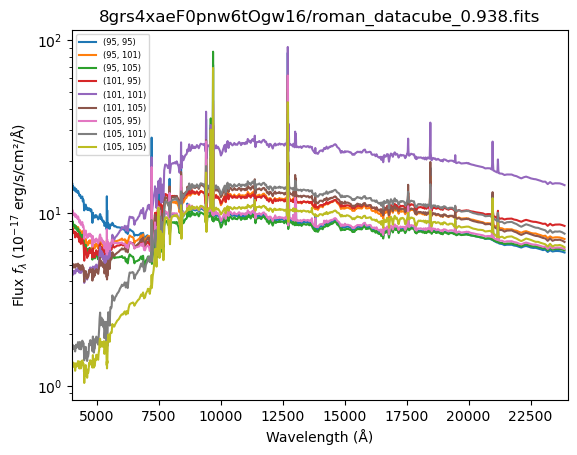

In [111]:
plot_spectra('8grs4xaeF0pnw6tOgw16', type='smoothed')

#### 2. Unsmoothed (Roman) for comparison: 

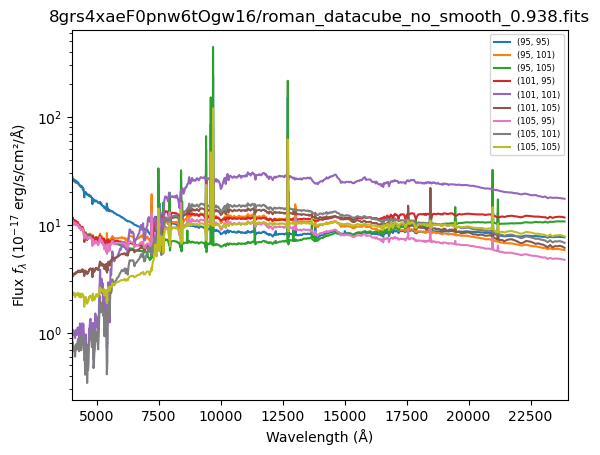

In [112]:
plot_spectra('8grs4xaeF0pnw6tOgw16', type='unsmoothed')

#### 3. Unsmoothed (SDSS): 

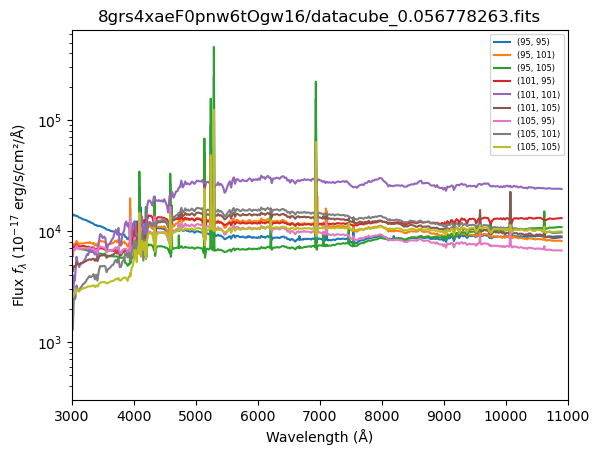

In [91]:
plot_spectra('8grs4xaeF0pnw6tOgw16', type='sdss')

## Generate a PDF for all datacubes: 

In [96]:
dir_paths

array(['3DcYQ0lb4KJyfzKzlUXI', 'LmJHI21YeTd4AwmYnEDm',
       '1fNHsdZlI87Brq4iYKAt', 'QQsrSrH8nA5pMBBkNgS1',
       'EbTKT5YQ2l4B7A2BgBqz', '33kuZBaMo0NbbMjaQ1cx',
       'XI4iMWh30qgbYQHXt0d1', '5iqcq8AiZ2Isdszu7qUc',
       '8grs4xaeF0pnw6tOgw16', 'bVQBSHo93R7m9GQLSVvU',
       'D1ORoZzQuMzEo3NCcWRZ', 'eQJHr49ZQ5QeCCYLbhv6'], dtype='<U80')

In [114]:
pix = [95, 101, 105]   

def spectra_pdf(paths, type):        # DIRECTORY paths
    
    for k, p in enumerate(paths): 

        name = datacube_names(p)[types['{}'.format(type)]]
        f = fits.open('{}'.format(name))
        wv = f[1].data
        flux = f[0].data

        # convert to erg/cm^2/s/nm: 
        flux = flux*1000
        # convert to erg/cm^2/s/A:
        flux = flux*10

        wv = wv.astype('float')

        if type != 'sdss': 
            l = np.where(np.isclose(wv, 400, atol=10) == True)[0][0]       # for roman range
            u = np.where(np.isclose(wv, 2400, atol=10) == True)[0][0]
        else: 
            l = np.where(np.isclose(wv, 300, atol=10) == True)[0][0] 
            u = np.where(np.isclose(wv, 1100, atol=10) == True)[0][0]      # sdss range if you want to plot it

        for i in pix: 
            for j in pix: 
                plt.figure(k)
                plt.plot(wv[l:u]*10, flux[l:u, i, j]*10**17, label='({}, {})'.format(i, j))    

        if type != 'sdss': 
            plt.xlim([4000, 24000])       # roman wavelengths (500-2300 nm)  
        else: 
            plt.xlim([3000, 11000])
            
        #plt.ylim([1e-22, 1e-18])     # can vary this
        plt.xlabel('Wavelength (Å)')
        plt.ylabel(r'Flux $f_{\lambda}$ ($10^{-17}$ erg/s/cm²/Å)')  # erg/cm^2/s/nm = 1000* W/m^2/nm
        plt.yscale('log')
        plt.legend(fontsize=6)
        plt.title('{}'.format(datacube_names(p)[types['{}'.format(type)]].replace(default, '')[1:]))

    p = PdfPages('spectra.pdf') 

    fig_nums = plt.get_fignums() 
    figs = [plt.figure(n) for n in fig_nums] 

    for fig in figs: 
        fig.savefig(p, format='pdf', bbox_inches="tight", pad_inches=0.1, transparent=True) 

    # close the object 
    p.close() 

In [ ]:
spectra_pdf(dir_paths, type='smoothed')